# Generación Text-to-Image con SDXS-512 (Optimizado para CPU)

**Módulo Complementario: Difusión Generativa 2025**

**IFTS24 - Prof. Matias Barreto**

---

## Objetivos de Aprendizaje

Al finalizar este notebook vas a poder:
- Generar imágenes sin necesidad de GPU
- Optimizar modelos para hardware modesto
- Comprender las técnicas de compresión de modelos
- Trabajar con latencias bajas en CPU
- Crear un flujo de trabajo eficiente sin GPU

---

## ¿Qué es SDXS-512?

SDXS-512 es un modelo de difusión ultra-comprimido diseñado específicamente para correr en CPUs:

**Características principales:**
- Generación en **1 paso** (ultra-rápido)
- Optimizado para **CPU** (no requiere GPU)
- Solo **~800ms en un Intel i7** moderno
- Modelo comprimido (~1 GB vs ~7 GB de SDXL)
- Resolución 512x512 (ideal para prototipos rápidos)

**Requisitos mínimos:**
- **CPU:** Intel i3 / Ryzen 3 o superior
- **RAM:** 4 GB disponible
- **Espacio:** ~2 GB para el modelo

**Ideal para:**
- Laptops sin GPU dedicada
- Prototipos rápidos
- Testing de prompts
- Aprendizaje sin inversión en hardware

---

## 1. Verificación de Sistema

In [ ]:
import torch
import sys
import platform
import psutil

print("=== Verificación del Sistema ===")
print(f"Sistema Operativo: {platform.system()} {platform.release()}")
print(f"Procesador: {platform.processor()}")
print(f"Python: {sys.version}")
print(f"PyTorch: {torch.__version__}")

# Memoria RAM
ram_gb = psutil.virtual_memory().total / 1e9
ram_disponible = psutil.virtual_memory().available / 1e9
print(f"\nRAM Total: {ram_gb:.2f} GB")
print(f"RAM Disponible: {ram_disponible:.2f} GB")

# CPU info
cpu_cores = psutil.cpu_count(logical=False)
cpu_threads = psutil.cpu_count(logical=True)
print(f"\nCPU Cores: {cpu_cores}")
print(f"CPU Threads: {cpu_threads}")

# GPU (opcional, pero preferimos CPU para este notebook)
if torch.cuda.is_available():
    print(f"\nGPU detectada: {torch.cuda.get_device_name(0)}")
    print("💡 Aunque tenés GPU, este notebook está optimizado para CPU")
else:
    print("\n✅ Sin GPU detectada - perfecto para este notebook")

# Recomendación
if ram_disponible >= 4:
    print("\n✅ Sistema adecuado para SDXS-512")
else:
    print("\n⚠️ ADVERTENCIA: RAM disponible limitada")
    print("Recomendación: Cerrá otras aplicaciones antes de continuar")

=== Verificación del Sistema ===
Sistema Operativo: Linux 6.6.105+
Procesador: x86_64
Python: 3.12.12 (main, Oct 10 2025, 08:52:57) [GCC 11.4.0]
PyTorch: 2.8.0+cu126

RAM Total: 13.61 GB
RAM Disponible: 12.24 GB

CPU Cores: 1
CPU Threads: 2

✅ Sin GPU detectada - perfecto para este notebook

✅ Sistema adecuado para SDXS-512


---

## 2. Instalación de Dependencias

📌 **IMPORTANTE:** Si estás en Google Colab o no tenés las dependencias instaladas, ejecutá esta celda.

In [ ]:
# Detectar si estamos en Google Colab
import sys
IN_COLAB = 'google.colab' in sys.modules

if IN_COLAB:
    print("Instalando dependencias en Google Colab...")
    !pip install -q diffusers[torch] transformers accelerate safetensors
    print("✅ Instalación completada")
else:
    print("Entorno local detectado. Asumiendo dependencias instaladas.")
    print("Si no están instaladas, ejecutá: pip install -r requirements.txt")

Instalando dependencias en Google Colab...
✅ Instalación completada


---

## 3. Importación de Bibliotecas

In [ ]:
import torch
from diffusers import StableDiffusionPipeline
from PIL import Image
import matplotlib.pyplot as plt
import time
from datetime import datetime
import os

# Configurar número de threads para optimizar CPU
torch.set_num_threads(psutil.cpu_count(logical=True))

print("✅ Bibliotecas importadas correctamente")
print(f"✅ Threads configurados: {torch.get_num_threads()}")

✅ Bibliotecas importadas correctamente
✅ Threads configurados: 2


---

## 4. Carga del Modelo SDXS-512

Vamos a cargar el modelo optimizado para CPU. La primera vez descarga ~1 GB.

In [ ]:
# Configuración
model_id = "IDKiro/sdxs-512-0.9"
device = "cpu"  # Forzamos CPU aunque haya GPU disponible

print(f"Cargando modelo: {model_id}")
print("Primera descarga: ~1 GB (puede tardar algunos minutos)")
print("Usos posteriores: carga desde caché local\n")

# Cargar pipeline optimizado para CPU
pipe = StableDiffusionPipeline.from_pretrained(
    model_id,
    torch_dtype=torch.float32,  # CPU usa float32
    safety_checker=None,  # Desactivamos para ahorrar memoria
)

# Mover a CPU explícitamente
pipe = pipe.to(device)

# Optimizaciones para CPU
pipe.enable_attention_slicing()

print(f"✅ Modelo cargado en: {device}")
print(f"✅ Optimizaciones aplicadas")

Cargando modelo: IDKiro/sdxs-512-0.9
Primera descarga: ~1 GB (puede tardar algunos minutos)
Usos posteriores: carga desde caché local



model_index.json:   0%|          | 0.00/545 [00:00<?, ?B/s]

Fetching 14 files:   0%|          | 0/14 [00:00<?, ?it/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/480 [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/807 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/613 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.31G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/9.79M [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

vae_large/diffusion_pytorch_model.safete(…):   0%|          | 0.00/335M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/635 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

The config attributes {'block_out_channels': [64, 64, 64, 64], 'sample_size': 512} were passed to AutoencoderTiny, but are not expected and will be ignored. Please verify your config.json configuration file.
`torch_dtype` is deprecated! Use `dtype` instead!
Expected types for vae: (<class 'diffusers.models.autoencoders.autoencoder_kl.AutoencoderKL'>,), got <class 'diffusers.models.autoencoders.autoencoder_tiny.AutoencoderTiny'>.


✅ Modelo cargado en: cpu
✅ Optimizaciones aplicadas


---

## 5. Tu Primera Generación en CPU

Vamos a generar una imagen y medir el tiempo que tarda.

Generando imagen...
Prompt: A cute cat sleeping on a sunny windowsill, watercolor painting

⏱️ Midiendo tiempo de generación...


  0%|          | 0/1 [00:00<?, ?it/s]

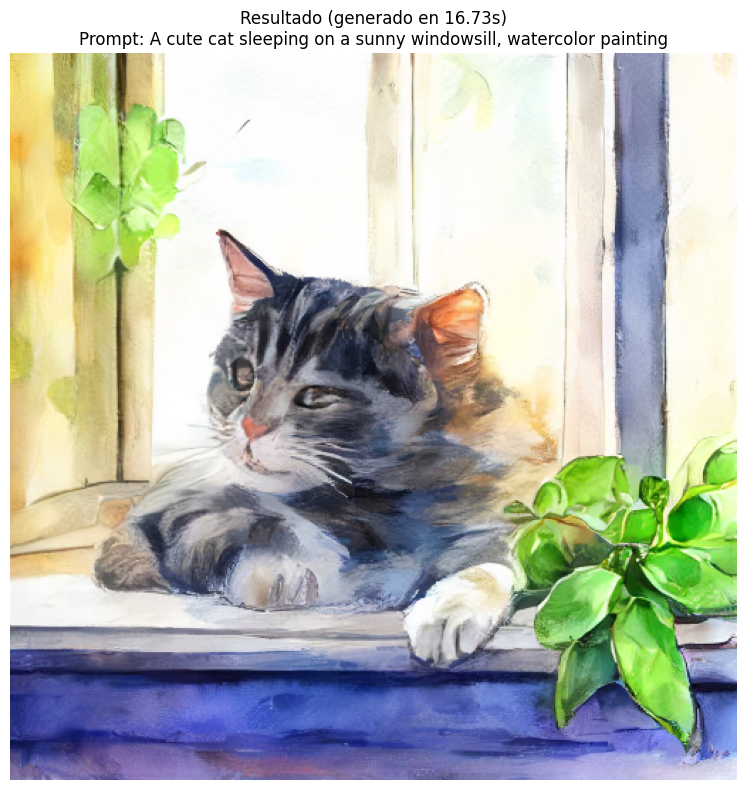


✅ Imagen generada en: 16.73 segundos
💡 TIP: En CPU moderno, debería tomar entre 30-120 segundos


In [ ]:
# Prompt de prueba
prompt = "A cute cat sleeping on a sunny windowsill, watercolor painting"

print(f"Generando imagen...")
print(f"Prompt: {prompt}\n")
print("⏱️ Midiendo tiempo de generación...")

# Medir tiempo
start_time = time.time()

# Generar imagen
image = pipe(
    prompt=prompt,
    num_inference_steps=1,  # SDXS funciona con 1 paso
    guidance_scale=0.0,  # Sin guidance para mayor velocidad
    height=512,
    width=512,
).images[0]

# Calcular tiempo
elapsed_time = time.time() - start_time

# Mostrar resultado
plt.figure(figsize=(8, 8))
plt.imshow(image)
plt.axis('off')
plt.title(f"Resultado (generado en {elapsed_time:.2f}s)\nPrompt: {prompt}")
plt.tight_layout()
plt.show()

print(f"\n✅ Imagen generada en: {elapsed_time:.2f} segundos")
print(f"💡 TIP: En CPU moderno, debería tomar entre 30-120 segundos")

---

## 6. Generación por Lotes (Batch)

Podemos generar múltiples imágenes del mismo prompt de forma eficiente.

Generando 4 variaciones...
Prompt: A serene mountain landscape at dawn, oil painting style

Generando imagen 1/4...


  0%|          | 0/1 [00:00<?, ?it/s]

Generando imagen 2/4...


  0%|          | 0/1 [00:00<?, ?it/s]

Generando imagen 3/4...


  0%|          | 0/1 [00:00<?, ?it/s]

Generando imagen 4/4...


  0%|          | 0/1 [00:00<?, ?it/s]

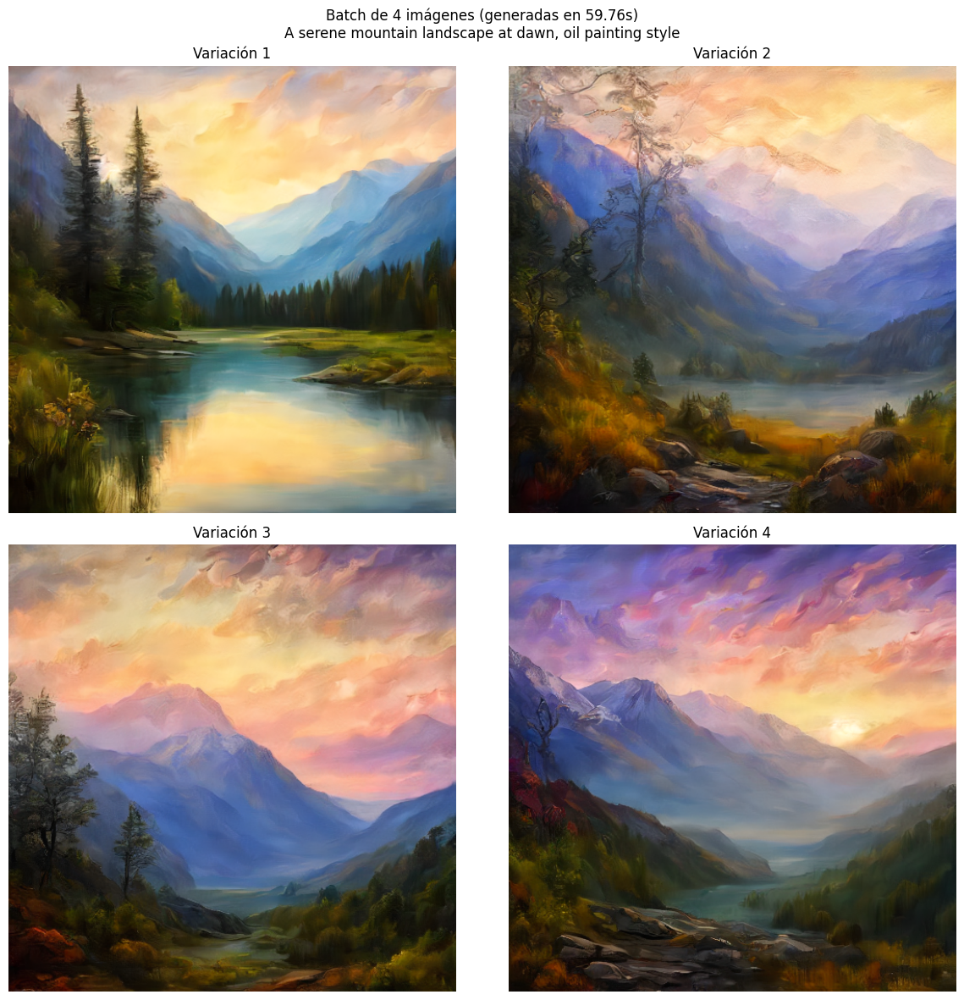


✅ 4 imágenes generadas en: 59.76s
⏱️ Tiempo promedio por imagen: 14.94s


In [ ]:
# Generar múltiples variaciones
prompt_batch = "A serene mountain landscape at dawn, oil painting style"
num_images = 4

print(f"Generando {num_images} variaciones...")
print(f"Prompt: {prompt_batch}\n")

start_time = time.time()

# Generar múltiples imágenes
images = []
for i in range(num_images):
    print(f"Generando imagen {i+1}/{num_images}...")

    img = pipe(
        prompt=prompt_batch,
        num_inference_steps=1,
        guidance_scale=0.0,
        height=512,
        width=512,
    ).images[0]

    images.append(img)

elapsed_time = time.time() - start_time

# Mostrar todas las imágenes
fig, axes = plt.subplots(2, 2, figsize=(12, 12))
axes = axes.flatten()

for idx, img in enumerate(images):
    axes[idx].imshow(img)
    axes[idx].axis('off')
    axes[idx].set_title(f"Variación {idx+1}")

plt.suptitle(f"Batch de {num_images} imágenes (generadas en {elapsed_time:.2f}s)\n{prompt_batch}")
plt.tight_layout()
plt.show()

print(f"\n✅ {num_images} imágenes generadas en: {elapsed_time:.2f}s")
print(f"⏱️ Tiempo promedio por imagen: {elapsed_time/num_images:.2f}s")

---

## 7. Experimentación con Prompts

La ventaja de SDXS es que podés iterar rápidamente probando muchos prompts.

Probando 4 prompts diferentes...

[1/4] Generando: A cozy coffee shop interior, warm lighting, vintag...


  0%|          | 0/1 [00:00<?, ?it/s]

[2/4] Generando: A spaceship landing on an alien planet, sci-fi ill...


  0%|          | 0/1 [00:00<?, ?it/s]

[3/4] Generando: A medieval castle on a cliff, dramatic sunset, fan...


  0%|          | 0/1 [00:00<?, ?it/s]

[4/4] Generando: A futuristic city street with neon signs, cyberpun...


  0%|          | 0/1 [00:00<?, ?it/s]

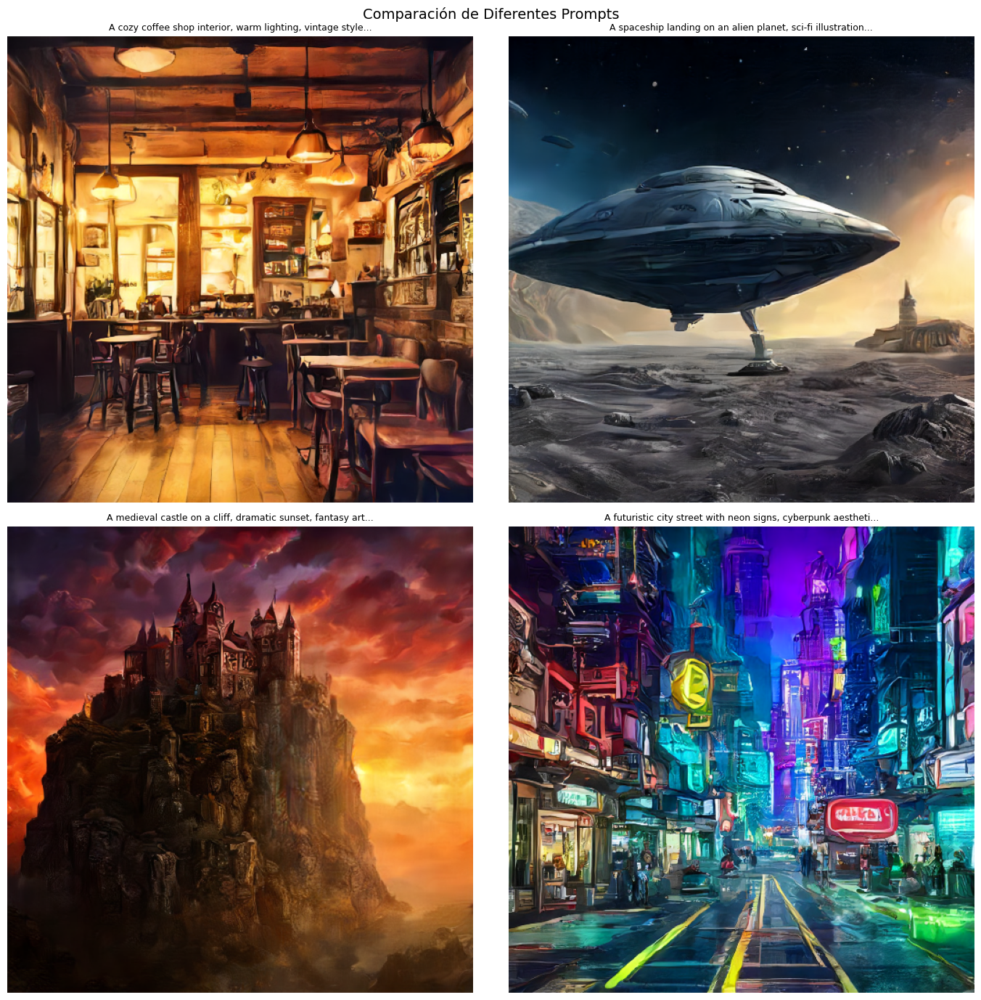


✅ Todas las variaciones generadas
💡 TIP: Notá cómo el modelo interpreta diferentes estilos


In [ ]:
# Lista de prompts para probar
prompts_test = [
    "A cozy coffee shop interior, warm lighting, vintage style",
    "A spaceship landing on an alien planet, sci-fi illustration",
    "A medieval castle on a cliff, dramatic sunset, fantasy art",
    "A futuristic city street with neon signs, cyberpunk aesthetic",
]

print(f"Probando {len(prompts_test)} prompts diferentes...\n")

fig, axes = plt.subplots(2, 2, figsize=(14, 14))
axes = axes.flatten()

for idx, prompt in enumerate(prompts_test):
    print(f"[{idx+1}/{len(prompts_test)}] Generando: {prompt[:50]}...")

    img = pipe(
        prompt=prompt,
        num_inference_steps=1,
        guidance_scale=0.0,
        height=512,
        width=512,
    ).images[0]

    axes[idx].imshow(img)
    axes[idx].axis('off')
    axes[idx].set_title(f"{prompt[:60]}...", fontsize=9)

plt.suptitle("Comparación de Diferentes Prompts", fontsize=14)
plt.tight_layout()
plt.show()

print("\n✅ Todas las variaciones generadas")
print("💡 TIP: Notá cómo el modelo interpreta diferentes estilos")

---

## 8. Seeds para Reproducibilidad

Al igual que otros modelos, podés usar seeds para resultados reproducibles.

Probando diferentes seeds...
Prompt: A peaceful zen garden with stone path and cherry blossoms

Generando con seed 42...


  0%|          | 0/1 [00:00<?, ?it/s]

Generando con seed 123...


  0%|          | 0/1 [00:00<?, ?it/s]

Generando con seed 456...


  0%|          | 0/1 [00:00<?, ?it/s]

Generando con seed 789...


  0%|          | 0/1 [00:00<?, ?it/s]

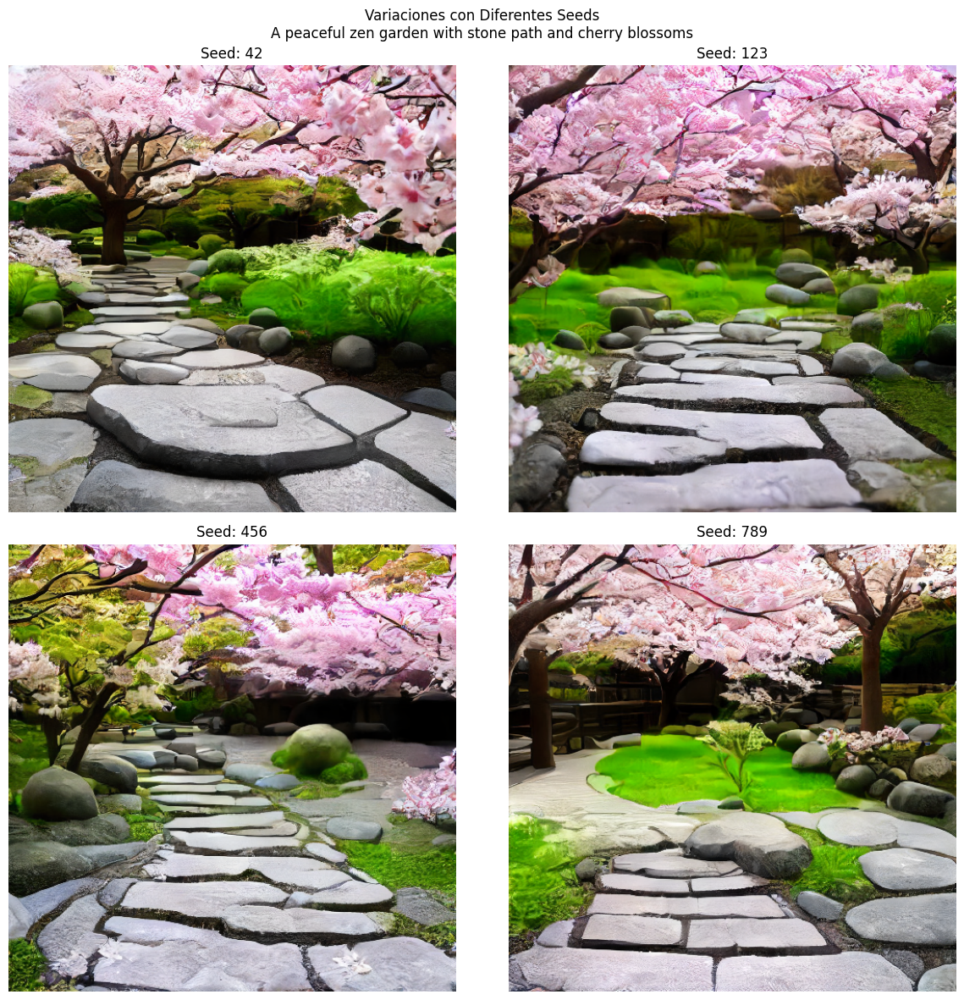


✅ Variaciones completadas
💡 TIP: Guardá las seeds de resultados que te gusten


In [ ]:
# Función auxiliar con seed
def generar_con_seed(prompt, seed):
    """Genera imagen con seed específica"""
    generator = torch.Generator(device=device).manual_seed(seed)

    image = pipe(
        prompt=prompt,
        num_inference_steps=1,
        guidance_scale=0.0,
        height=512,
        width=512,
        generator=generator,
    ).images[0]

    return image

# Probar diferentes seeds con el mismo prompt
prompt_seeds = "A peaceful zen garden with stone path and cherry blossoms"
seeds_to_test = [42, 123, 456, 789]

print(f"Probando diferentes seeds...")
print(f"Prompt: {prompt_seeds}\n")

fig, axes = plt.subplots(2, 2, figsize=(12, 12))
axes = axes.flatten()

for idx, seed in enumerate(seeds_to_test):
    print(f"Generando con seed {seed}...")

    img = generar_con_seed(prompt_seeds, seed)

    axes[idx].imshow(img)
    axes[idx].axis('off')
    axes[idx].set_title(f"Seed: {seed}")

plt.suptitle(f"Variaciones con Diferentes Seeds\n{prompt_seeds}")
plt.tight_layout()
plt.show()

print("\n✅ Variaciones completadas")
print("💡 TIP: Guardá las seeds de resultados que te gusten")

---

## 9. Optimización de Velocidad

Veamos cómo afecta el número de threads al rendimiento.

In [ ]:
# Benchmark de velocidad con diferentes configuraciones
prompt_bench = "A simple landscape with trees and sky"

# Probar con diferentes números de threads
thread_configs = [
    1,
    psutil.cpu_count(logical=False),  # Cores físicos
    psutil.cpu_count(logical=True),   # Todos los threads
]

print("Benchmark de velocidad con diferentes configuraciones...")
print(f"Prompt: {prompt_bench}\n")

resultados = []

for threads in thread_configs:
    print(f"Probando con {threads} thread(s)...")

    # Configurar threads
    torch.set_num_threads(threads)

    # Medir tiempo
    start = time.time()

    img = pipe(
        prompt=prompt_bench,
        num_inference_steps=1,
        guidance_scale=0.0,
        height=512,
        width=512,
    ).images[0]

    elapsed = time.time() - start

    resultados.append((threads, elapsed))
    print(f"  Tiempo: {elapsed:.2f}s\n")

# Mostrar resultados
print("\n=== Resultados del Benchmark ===")
for threads, tiempo in resultados:
    print(f"{threads} thread(s): {tiempo:.2f}s")

# Encontrar configuración más rápida
mejor = min(resultados, key=lambda x: x[1])
print(f"\n✅ Mejor configuración: {mejor[0]} threads ({mejor[1]:.2f}s)")

# Restaurar configuración óptima
torch.set_num_threads(mejor[0])
print(f"✅ Threads configurados a: {mejor[0]}")

Benchmark de velocidad con diferentes configuraciones...
Prompt: A simple landscape with trees and sky

Probando con 1 thread(s)...


  0%|          | 0/1 [00:00<?, ?it/s]

  Tiempo: 19.72s

Probando con 1 thread(s)...


  0%|          | 0/1 [00:00<?, ?it/s]

  Tiempo: 15.12s

Probando con 2 thread(s)...


  0%|          | 0/1 [00:00<?, ?it/s]

  Tiempo: 20.77s


=== Resultados del Benchmark ===
1 thread(s): 19.72s
1 thread(s): 15.12s
2 thread(s): 20.77s

✅ Mejor configuración: 1 threads (15.12s)
✅ Threads configurados a: 1


---

## 10. Guardar Imágenes

Guardamos nuestras generaciones favoritas con metadata.

Generando imagen final para guardar...
Prompt: A magical library with floating books and glowing crystals, fantasy illustration
Seed: 999



  0%|          | 0/1 [00:00<?, ?it/s]

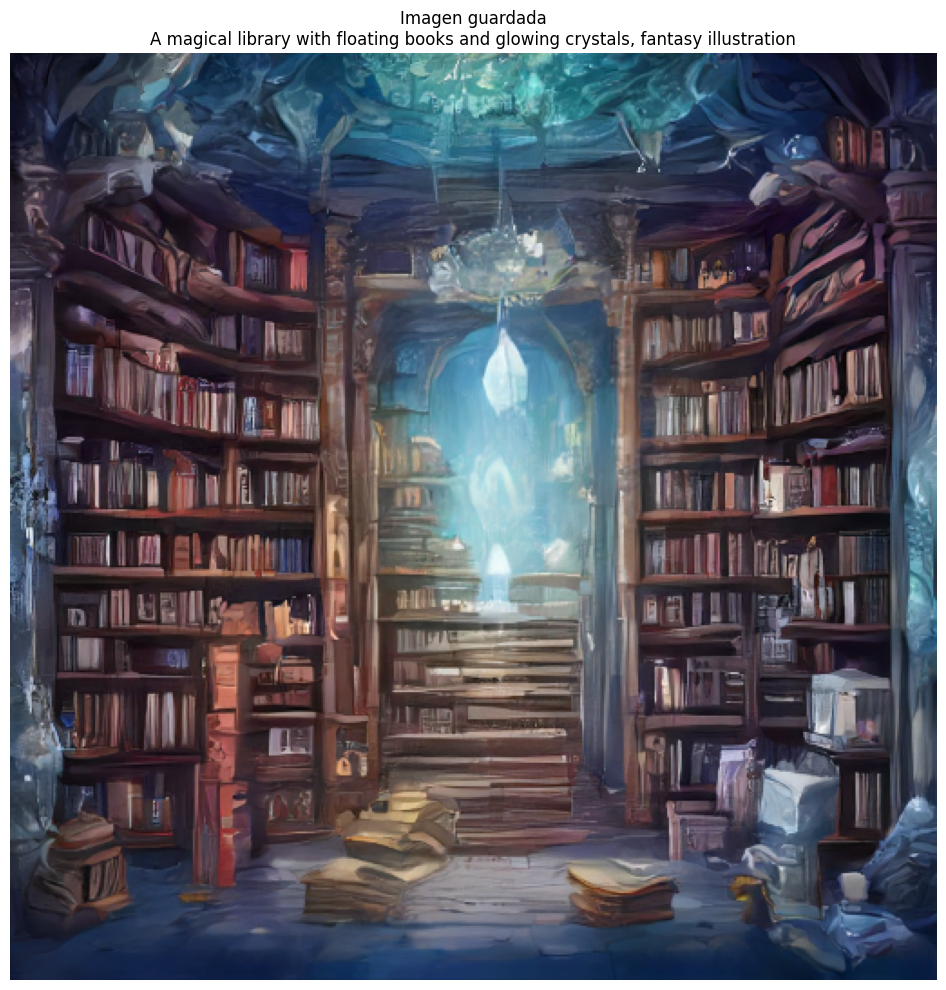


✅ Imagen guardada en: sdxs_generaciones/sdxs_20251029_213750_999.png
📁 Carpeta de salida: sdxs_generaciones/


In [ ]:
from PIL import PngImagePlugin

# Crear carpeta de salida
output_dir = "sdxs_generaciones"
os.makedirs(output_dir, exist_ok=True)

def guardar_imagen_cpu(image, prompt, seed, output_dir):
    """Guarda imagen con metadata"""
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    filename = f"sdxs_{timestamp}_{seed}.png"
    filepath = os.path.join(output_dir, filename)

    # Metadata
    metadata = PngImagePlugin.PngInfo()
    metadata.add_text("prompt", prompt)
    metadata.add_text("seed", str(seed))
    metadata.add_text("model", "SDXS-512-0.9")
    metadata.add_text("device", "CPU")
    metadata.add_text("timestamp", timestamp)

    image.save(filepath, pnginfo=metadata)

    return filepath

# Generar y guardar imagen final
prompt_final = "A magical library with floating books and glowing crystals, fantasy illustration"
seed_final = 999

print(f"Generando imagen final para guardar...")
print(f"Prompt: {prompt_final}")
print(f"Seed: {seed_final}\n")

imagen_final = generar_con_seed(prompt_final, seed_final)

# Guardar
saved_path = guardar_imagen_cpu(
    image=imagen_final,
    prompt=prompt_final,
    seed=seed_final,
    output_dir=output_dir
)

# Mostrar
plt.figure(figsize=(10, 10))
plt.imshow(imagen_final)
plt.axis('off')
plt.title(f"Imagen guardada\n{prompt_final}")
plt.tight_layout()
plt.show()

print(f"\n✅ Imagen guardada en: {saved_path}")
print(f"📁 Carpeta de salida: {output_dir}/")

---

## 💡 Consejos para Usar SDXS en CPU

### Ventajas
✅ No requiere GPU (funciona en cualquier laptop moderna)
✅ Generación rápida para iteración de prompts
✅ Modelo pequeño (~1 GB vs ~7 GB de SDXL)
✅ Perfecto para prototipado y testing

### Limitaciones
⚠️ Resolución fija 512x512 (no escalable)
⚠️ Calidad inferior a modelos más grandes
⚠️ Menos detalles finos que SDXL o FLUX
⚠️ Solo 1 paso de inferencia (sin control granular)

### Mejores Prácticas
1. **Prompts claros y concisos**: El modelo funciona mejor con descripciones directas
2. **Usalo para prototipos**: Probá ideas rápidamente antes de usar modelos más pesados
3. **Iterá con seeds**: Guardá seeds de buenos resultados
4. **Complementá con upscaling**: Usá super-resolution posterior si necesitás más detalle

---

## ✅ Ejercicios

### Ejercicio 1: Galería temática
Creá una galería de 6 imágenes sobre un tema específico (ej: "arquitectura futurista", "naturaleza", "vida urbana")

### Ejercicio 2: Comparación de estilos
Tomá un mismo sujeto y generalo en 4 estilos diferentes:
- "realistic photography"
- "oil painting"
- "cartoon style"
- "minimalist illustration"

### Ejercicio 3: Benchmark personalizado
Medí el tiempo de generación en tu sistema específico y compará con las especificaciones del modelo.

### Ejercicio 4: Seeds favoritas
Generá 20 imágenes con el mismo prompt pero diferentes seeds. Guardá las 5 mejores con sus seeds.

---

## 🔍 Para Profundizar

**Recursos adicionales:**
- Modelo en Hugging Face: https://huggingface.co/IDKiro/sdxs-512-0.9
- Paper de SDXS: https://arxiv.org/abs/2403.16627
- Guía de prompts: `06_Material_Apoyo/Guia_Prompts_Efectivos.md`

**Próximos pasos:**
- Si querés mejor calidad y tenés GPU, probá `011_Text_to_Image_SDXL_Turbo.ipynb`
- Para acelerar cualquier modelo, mirá `013_Text_to_Image_LCM_LoRA.ipynb`
- Para aplicar super-resolution a estas imágenes, continuá con `021_Super_Resolution_Actualizado.ipynb`

---

**¡Felicitaciones!** Ahora podés generar imágenes con IA sin necesidad de GPU. 🎉